Pour un webjournaliste, le premier avantage de s'initier à la programmation est **la personnalisation de contenus**. Cela vaut pour les datavisualisations paramétrables grâce à diverses bibliothèques JS ou Python, mais peut aussi s'appliquer à des choses plus terre à terre... Par exemple **les photos satellite**, dont celles prises **par les fameux Sentinel de l'Agence spatiale européenne**.

L'interface [EO Browser](https://apps.sentinel-hub.com/eo-browser/?zoom=10&lat=41.9&lng=12.5&themeId=DEFAULT-THEME) est une mine d'or permettant de se constituer une base de photographies à divers intervalles... Du moment qu'il fait beau !

Cerise sur le gâteau, EOB inclut diverses options, dont une "Timelapse" qui permet d'animer les changements survenus dans une zone précise. Voici en illustration, la construction du [Grand Contournement Ouest de Strasbourg](https://www.rue89strasbourg.com/tag/gco) :

![GCO, que voilà !](S2L2A-timelapse.gif "GCO, que voilà !")

Ce rendu est bon, mais pourrait-on en faire **une variante avec un petit truc en plus** ? Par exemple, pourrait-on superposer le contour de la ville de Strasbourg afin de mieux se repérer ?

Le carnet suivant propose quelques recettes simples pour y arriver.

## Manipuler un répertoire d'images avec PIL

[Python Imaging Library](https://pillow.readthedocs.io/en/stable/) est le premier module que l'on va manipuler dans ce tutoriel.

Mais avant toute chose, quelques conseils pour se constitnuer un répertoire d'images :

* être sûr d'avoir **le "bon" plan**. Si on ne désire pas se lancer dans un périlleux timelapse-traveling, **on cadrera le mieux possible EO Browser** et on n'y touchera plus le temps de télécharger les photos utiles
* **copier/coller l'URL** une fois ce cadre acquis. Les précieux couples latitude/longitude et le niveau de zoom permettront de récupérer le bon cadre en cas de pépin
* télécharger les photos **en haute résolution**. Ce sera plus lourd, mais évitera d'avoir à retélécharger des image de meilleure qualité
* **garder les photos d'origine dans un dossier dédié**. On peut se planter en manipulant ces images, et copier/coller un dossier tout fait sera toujours plus rapide que se fader une énième fois des manips sur EOB

On va partir du principe qu'un répertoire de photos dans lesquelles on peut tailler est constitué, et importer les premiers modules utiles :

In [1]:
import os
from PIL import ImageTk, Image

C'est une évidence, mais il faut absolument que rien ne dépasse côté images. Il faut, par exemple, **qu'elles aient strictement les mêmes dimensions**. 

Une première fonction coule de source : **afficher les différentes résolutions** d'images trouvées dans un dossier.

In [2]:
def verif_resolution(repertoire):
    l_res = []
    for photo in os.listdir(repertoire):
        if photo.endswith(".jpg") or photo.endswith(".png"): 
            chemin = os.path.join(repertoire, photo)
            with Image.open(chemin) as img:
                width, height = img.size
                dim = (width, height)
                l_res.append(dim)
            continue
    # la ligne suivante permet de virer tous les doublons dans l_res et de mettre les valeurs uniques dans une liste
    l_res = list(set(l_res))
    if len(l_res)==1:
        print("Une seule résolution trouvée dans le répertoire ", repertoire, " : ")
        print(l_res[0][0], "x",l_res[0][1])
    else:
        print(len(l_res), " résolution différentes trouvées dans le répertoire ", repertoire, " : ")
        for tuple in l_res:
            print(tuple[0],"x",tuple[1])
    return l_res

Ne serait-il pas de bon ton de tester tout ça ? Claro que sí !

In [3]:
liste_reso_gco = verif_resolution("bac_a_sable/images/")

c:\users\raphael\appdata\local\programs\python\python39\lib\site-packages\PIL\Image.py:2834: DecompressionBombWarning: Image size (130033350 pixels) exceeds limit of 89478485 pixels, could be decompression bomb DOS attack.
  warnings.warn(
c:\users\raphael\appdata\local\programs\python\python39\lib\site-packages\PIL\Image.py:2834: DecompressionBombWarning: Image size (138142850 pixels) exceeds limit of 89478485 pixels, could be decompression bomb DOS attack.
  warnings.warn(


2  résolution différentes trouvées dans le répertoire  bac_a_sable/images/  : 
16550 x 7857
16550 x 8347


Mince, deux résolutions différentes... On va mesurer l'ampleur des dégâts en codant une nouvelle fonction qui va, dans un répertoire d'images :

* rechercher celles d'un format
* afficher **une seule image par format**
* écart technique : l'affichage correct d'une image dans un notebook ne peut se faire que grâce à un module Image, qui a donc le même nom que celui de PIL. Pour éviter tout conflit, **on lui donnera le joli surnom "Imagerie"**

Adelante ? Adelante !

In [4]:
from IPython.display import Image as Imagerie
from IPython.display import display

def affiche_resolutions(repertoire, liste):
    photos_retenues = []
    for dimensions in liste:
        # on va rassembler les photos associées à chaque résolution
        petite_liste = []
        largeur = dimensions[0]
        hauteur = dimensions[1]
        for photo in os.listdir(repertoire):
            if photo.endswith(".jpg") or photo.endswith(".png"):
                chemin = os.path.join(repertoire, photo)
                with Image.open(chemin) as img:
                    if img.size == (largeur, hauteur):
                        petite_liste.append(chemin)
        # et on ne retient dans photos_retenues que la première... pour n'avoir qu'une photo par résolution
        photos_retenues.append(petite_liste[0])
    # on parcourt en parallèle les chemins de photos et les résolutions pour les comparer
    for ref, reso in zip(photos_retenues,liste):
        print("Image de résolution",reso[0],"x",reso[1], "(", ref,")")
        im = Imagerie(ref)
        display(im)

**ATTENTION :** l'affichage d'images en haute définition **alourdit beaucoup trop** ce carnet par rapport aux limites de GitHub. Je vais donc remplacer affiche_resolutions("bac_a_sable/images/", liste_reso_gco) par sa capture d'écran :

![GCO, que voilà !](capture_resolution.png "GCO, que voilà !")

En observant bien, on ne voit pas de grande différence... On va donc faire un pari audacieux, inspiré par les abords du Rhin aux extrémités de ces deux images :

* **diviser la différence de hauteur par  deux**
* **retrancher ce qui dépasse**, en haut, et en bas, dans cette même proportion

Traduction en fonction :

In [5]:
from PIL import ImageOps

def taillage_equivalent(repertoire,liste):
    # on prend en référence la résolutions de photo la plus petite
    dim_ref = tuple(map(min, zip(*liste)))
    # on parcourt ensuite un répertoire à la recherche de photos
    for photo in os.listdir(repertoire):
            if photo.endswith(".jpg") or photo.endswith(".png"):
                chemin = os.path.join(repertoire, photo)
                with Image.open(chemin) as img:
                    # on retient les dimensions de chaque candidate
                    largeur, hauteur = img.size
                    tranche_l=int((largeur-dim_ref[0])/2)
                    tranche_h=int((hauteur-dim_ref[1])/2)
                    # et on compare ensuite chaque largeur/hauteur aux dimensions de référence, en agissant à chaque fois
                    if dim_ref[0]<largeur & dim_ref[1]<hauteur:
                        print("L'image ", chemin, " va être retaillée de ",tranche_l," pixel sur les côtés de ",tranche_h," pixels sur les hauteurs")
                        bordures = (tranche_l,tranche_h,tranche_l, tranche_h)
                        im = ImageOps.crop(img, bordures)
                        im = im.save(chemin) 
                    elif dim_ref[0]<largeur:
                        print("L'image ", chemin, " va être retaillée de ",tranche_l," pixels à gauche et à droite")
                        bordures = (tranche_l, 0, tranche_l, 0)
                        im = ImageOps.crop(img, bordures)
                        im = im.save(chemin) 
                    elif dim_ref[1]<hauteur:
                        print("L'image ", chemin, " va être retaillée de ",tranche_h," pixels en haut et en bas")
                        bordures = (0, tranche_h, 0, tranche_h)
                        im = ImageOps.crop(img, bordures)
                        im = im.save(chemin)
                    else:
                        print(chemin," est parfaite, pourquoi la retailler ?")

Et on teste :

In [6]:
taillage_equivalent("bac_a_sable/images/", liste_reso_gco)

bac_a_sable/images/2018-10-12-00_00_2018-10-12-23_59_Sentinel-2_L2A_True_color.jpg  est parfaite, pourquoi la retailler ?
L'image  bac_a_sable/images/2018-11-11-00_00_2018-11-11-23_59_Sentinel-2_L2A_True_color.jpg  va être retaillée de  245  pixels en haut et en bas
L'image  bac_a_sable/images/2019-02-14-00_00_2019-02-14-23_59_Sentinel-2_L2A_True_color.jpg  va être retaillée de  245  pixels en haut et en bas
bac_a_sable/images/2019-02-24-00_00_2019-02-24-23_59_Sentinel-2_L2A_True_color.jpg  est parfaite, pourquoi la retailler ?
L'image  bac_a_sable/images/2019-03-21-00_00_2019-03-21-23_59_Sentinel-2_L2A_True_color.jpg  va être retaillée de  245  pixels en haut et en bas
L'image  bac_a_sable/images/2019-03-31-00_00_2019-03-31-23_59_Sentinel-2_L2A_True_color.jpg  va être retaillée de  245  pixels en haut et en bas
bac_a_sable/images/2019-04-15-00_00_2019-04-15-23_59_Sentinel-2_L2A_True_color.jpg  est parfaite, pourquoi la retailler ?
bac_a_sable/images/2019-04-20-00_00_2019-04-20-23_59_S

Des images à la même dimension, on peut passer à la suite plus technique, mais non moins palpitante.

## Raster ? Vecteur ? Moteur !

Un raster est l'équivalent, en gréographie numérique, d'une photo : **il pixellise à force de zoom**, à l'inverse des vecteurs. Mais, contrairement à la plupart des clichés, **ses métadonnées contiennent des informations géographiques**, très prisées dans notre cas.

En résumé, pourrait-on :

* afficher un raster partageant le même cadre que les photos manipulées avant ?
* calquer dessus un vecteur  (par exemple le contour de la ville de Strasbourg) ?
* isoler ce vecteur bien placé dans une image png partageant le ratio de nos photos précédentes ?

Pourquoi ne pas essayer ?

### A notre gauche, le raster

Donc, le raster. Tout va se passer dans EO Browser, **en gardant l'exact cadre utilisé pour les photos** (j'ai glissé ces infos dans le dossier bac_a_sable/raster-vecteur). De là, on va télécharger un seul fichier Raw, tel que montré par la capture d'écran suivante :

![Import de tiff](interface_eob_tiff.png "Import de fichier TIFF")

[La projection cartographique](https://www.nautischool.ch/pdf/AC_FS_projection_carto.pdf) va notamment retenir notre attention. 

Longue histoire courte : **le passage d'une surface de volume à un plan** nécessite une projection. Aucune n'est mathématiquement parfaite, et leur choix relève surtout **d'un compromis entre les déformations produites** (en particulier sur les aires et/ou les angles).

Donc, **on va bien retenir la projection associée à notre raster** car... Le vecteur qu'on va calquer dessus devra partager la même !

Assez bavardé, et commençons à faire des manip basique grâce [au module rasterio](https://rasterio.readthedocs.io/en/latest/).

In [7]:
import rasterio
from rasterio.plot import show

src = rasterio.open("bac_a_sable/raster-vecteur/2018-10-12-00_00_2018-10-12-23_59_Sentinel-2_L2A_B8A_(Raw).tiff")

print("Les dimensions du raster sont ",src.width,"x",src.height, " pixels")
print("Sa projection est : ",src.crs)
print("Le centre géographique de l'image se trouve aux coordonnées : ", src.xy(src.height // 2, src.width // 2))

Les dimensions du raster sont  2500 x 1187  pixels
Sa projection est :  EPSG:3857
Le centre géographique de l'image se trouve aux coordonnées :  (851484.9524921516, 6205845.889445178)


On va maintenant visualiser ce raster à l'aide de [l'incontournable module matplotlib](https://github.com/raphadasilva/blog_rdasilva/blob/master/visualisations/deces_covid_vizu_simples/Visualisation%20simples%20-%20Python%20panda%20matplotlib.ipynb) :

<AxesSubplot:>

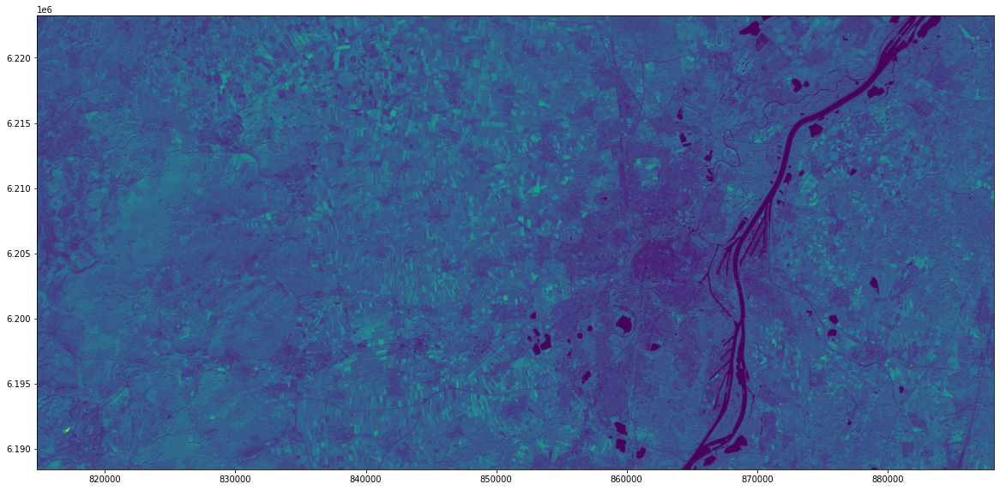

In [8]:
import matplotlib.pyplot as plt

fig, ax = plt.subplots(figsize=(20, 10))
show(src.read(), transform=src.transform, ax=ax)

Le cadre est là, reste plus qu'à lui coller les contours d'une certaine ville.

### A notre droite, le vecteur

Sans s'embarrasser de trop de considération techniques, on partira du principe que les différents tracés communaux de France ont été [téléchargés sur le portait data.gouv.fr](https://www.data.gouv.fr/fr/datasets/decoupage-administratif-communal-francais-issu-d-openstreetmap/), au format shp de date la plus récente. On aura également versé les six principaux fichiers dans le même dossier que le raster précédent.

Ces considérations actées, on va utiliser [le module geopandas](https://geopandas.org/), en ouvrant le fichier .shp :

In [9]:
# les deux lignes suivantes sont indispensables pour éviter de faire planter la lecture du fichier
# source : https://stackoverflow.com/questions/62075847/using-qgis-and-shaply-error-geosgeom-createlinearring-r-returned-a-null-pointer
from shapely import speedups
speedups.disable()

import geopandas as gpd

GDF = gpd.read_file("bac_a_sable/raster-vecteur/communes-20200101.shp")

GDF.head()

,insee,nom,wikipedia,surf_ha,geometry
0,89412,Thizy,fr:Thizy (Yonne),559.0,"POLYGON ((4.04305 47.56271, 4.04345 47.56303, ..."
1,17180,Gourvillette,fr:Gourvillette,802.0,"POLYGON ((-0.24733 45.88792, -0.24715 45.88820..."
2,17451,Les Touches-de-Périgny,fr:Les Touches-de-Périgny,2153.0,"POLYGON ((-0.30449 45.91087, -0.30446 45.91120..."
3,55222,Gussainville,fr:Gussainville,1043.0,"POLYGON ((5.63106 49.16754, 5.63123 49.16779, ..."
4,55072,Braquis,fr:Braquis,493.0,"POLYGON ((5.60518 49.15635, 5.60896 49.15738, ..."


On passe à la projection :

In [10]:
print(GDF.crs)

epsg:4326


Donc... Ce n'est pas la même que le raster. Qu'à cela ne tienne, on va opérer ni une ni deux (enfin ça peut quand même prendre une à deux minutes) à une reprojection :

In [11]:
GDF = GDF.to_crs("EPSG:3857")

print(GDF.crs)

EPSG:3857


On va juste retenir Strasbourg dans une nouvelle GeoDataFrame. Le principe est le même que sur pandas :

* **une condition en variable**, qui servira de masque
* l'application de ce masque **pour ne retenir que la portion qui nous préoccupe**

In [12]:
condi_stras = GDF["nom"] == "Strasbourg"

GDF_stras = GDF[condi_stras]
GDF_stras = GDF_stras[["nom","geometry"]]

GDF_stras.head()

,nom,geometry
14519,Strasbourg,"POLYGON ((855839.510 6207170.840, 856013.310 6..."


Plus qu'une ligne de cette BDD, bien nommée Strasbourg, mais qui est un polygone, autrement dit une surface pleine.

On va régler ça grâce [à la fonction boudray](https://geopandas.org/geometric_manipulations.html) :

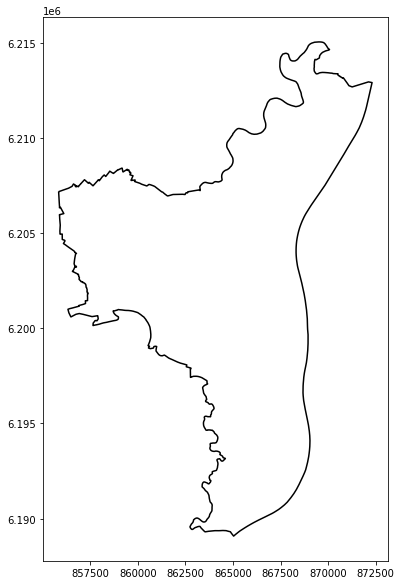

In [13]:
contours_stras = GDF_stras.boundary

fig, ax = plt.subplots(figsize=(20, 10))
contours_stras.plot(ax=ax, color='#000') 
plt.show()

### Et au milieu, une fusion

Le contour vectoriel s'est bien affiché, a priori dans la bonne projection. Mais **ce vecteur est dans son propre espace**, et nous cherchons à **le circonscrire dans un cadre précis**.

On va tenter la manip grâce à matplotlib, puis enregistrer le résultat dans un png :

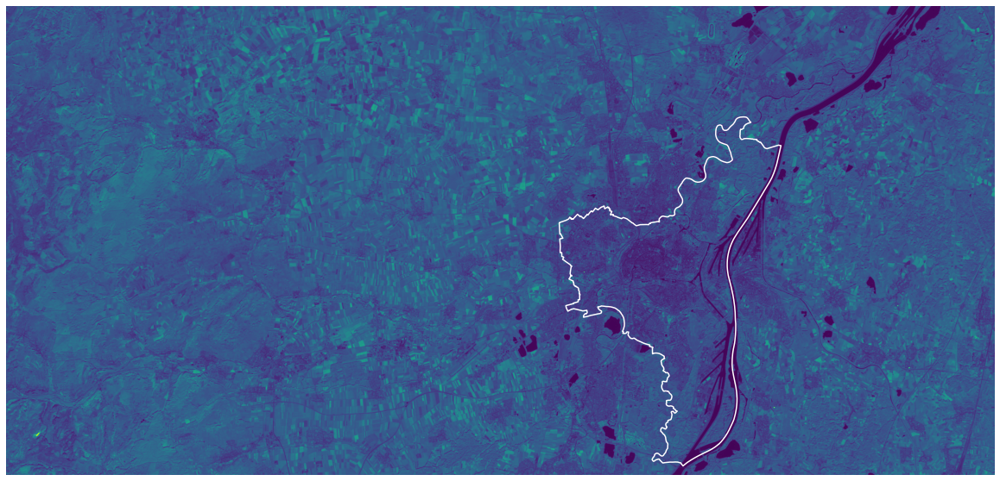

In [14]:
fig, ax = plt.subplots(figsize=(21, 10))
show(src.read(), transform=src.transform, ax=ax)
contours_stras.plot(ax=ax, color='#fff')
ax.set_axis_off()
fig.savefig("repere_strasbourg.png", dpi=200, bbox_inches = 'tight')
plt.show()

L'histoire aurait dû s'arrêter là mais, malgré l'attribut bbox_inches = 'tight' et diverses recherches, **il demeure TOUJOURS une marge inutile à l'image**, qui augmente sa taille, et fausse donc le ratio. Or, rien ne doit dépasser pour ce que l'on s'apprête à faire...

Quel que soit le dpi et donc les dimensions de l'image, ce pourcentage en trop est le même, en hauteur comme en largeur. On peut donc coder **une fonction qui gomme ce ratage**, mais si une belle âme a la solution pour régler ce souci sur matplotlib, elle sera évidemment louée.

In [15]:
def decoupage_selon_pct(image,pct_largeur,pct_hauteur):
    with Image.open(image) as img:
        largeur, hauteur = img.size
        n_largeur = int(round(largeur*pct_largeur))
        n_hauteur = int(round(hauteur*pct_hauteur))
        print("L'image idéale devrait avoir une largeur de ",n_largeur," pixels et une hauteur de ",n_hauteur," pixels")
        t_l = int(round((largeur-n_largeur)/2))
        t_h = int(round((hauteur-n_hauteur)/2))
        print("Nous allons donc retrancher ",t_l," pixels sur les côtés et ",t_h, " pixels sur les hauteurs")
        bordures = (t_l,t_h,t_l, t_h)
        im = ImageOps.crop(img, bordures)
        im = im.save(image)

Plus qu'à exécuter :

In [16]:
decoupage_selon_pct("repere_strasbourg.png",.988,.974)

L'image idéale devrait avoir une largeur de  3179  pixels et une hauteur de  1510  pixels
Nous allons donc retrancher  20  pixels sur les côtés et  20  pixels sur les hauteurs


Et maintenant ?

L'avantage du raster utilisé en calque est qu'il n'intègre pas une seule fois **un blanc comme celui du vecteur**. Donc... on va coder une fonction pour virer d'une image **tous les pixels qui ne sont pas blancs**. Il ne restera ainsi que le contour de la ville, bien placé dans le cadre !

In [17]:
def contours_png(image):
    with Image.open(image).convert("RGBA") as img:
        pixels = img.load()
        # pour chaque coordonnée i sur la largeur
        for i in range(img.size[0]):
            # et pour leur équivalent sur la hauteur
            for j in range(img.size[1]):
                # si le pixel à leur croisement n'est pas tout blanc
                if pixels[i,j] != (255, 255, 255,255):
                    # il devient transparent
                    pixels[i,j] = (0, 0, 0, 0)
    # et à la sortie, on écraser le fichier précédent
    im = img.save(image)

Et on déroule :

In [18]:
contours_png("repere_strasbourg.png")

A présent, on déployer ce repère sur toutes les photos d'un répertoire grâce à une fonction :

In [19]:
def repere_deploye(repere,repertoire):
    with Image.open(repere) as mdl:
        # on isole chaque dimension de l'image repère
        l_modele, h_modele = mdl.size
        print("Le modèle a une dimension de ",l_modele, "x", h_modele," pixels")
        for photo in os.listdir(repertoire):
            if photo.endswith(".jpg") or photo.endswith(".png"):
                chemin = os.path.join(repertoire, photo)
                with Image.open(chemin) as img:
                    # on redimensionne chaque image selon le repère (dont le ratio est le même ou très proche)
                    img = img.resize((l_modele, h_modele), Image.ANTIALIAS)
                    # on plaque ce repère sur l'image
                    img.paste(mdl, (0, 0), mdl)
                    # et on écrase la précédente
                    img.save(os.path.join(chemin))

Plus qu'à déployer :

In [20]:
repere_deploye("repere_strasbourg.png","bac_a_sable/images/")

Le modèle a une dimension de  3178 x 1510  pixels


c:\users\raphael\appdata\local\programs\python\python39\lib\site-packages\PIL\Image.py:2834: DecompressionBombWarning: Image size (130033350 pixels) exceeds limit of 89478485 pixels, could be decompression bomb DOS attack.
  warnings.warn(


## Le diable est dans les détails

On est très bien parti, mais on peut encore peaufiner l'une ou l'autre chose. Par exemple retailler l'image aux extrémités.

Le plan est de :

* paramétrer **les bordures en variables de fonction**
* **afficher un exemple de retaillage**, et demander sa confirmation
* si l'utilisateur **saisit le mot magique**, tailler l'ensemble des images suivant ce modèle !

In [23]:
def taillage_selection(repertoire, bordures):
    # on commence par considérer la dernière image du dossier
    with Image.open(os.path.join(repertoire, os.listdir(repertoire)[-1])) as test:
        im = ImageOps.crop(test, bordures)
        display(im)
        reponse = input("OK pour ce retaillage ?")
        if reponse != "OK":
            print("Eh bien retentez autre chose !")
        else:
            print("C'est parti...")
            for photo in os.listdir(repertoire):
                chemin = os.path.join(repertoire, photo)
                with Image.open(chemin) as img:
                    im = ImageOps.crop(img, bordures)
                    im.save(os.path.join(chemin))

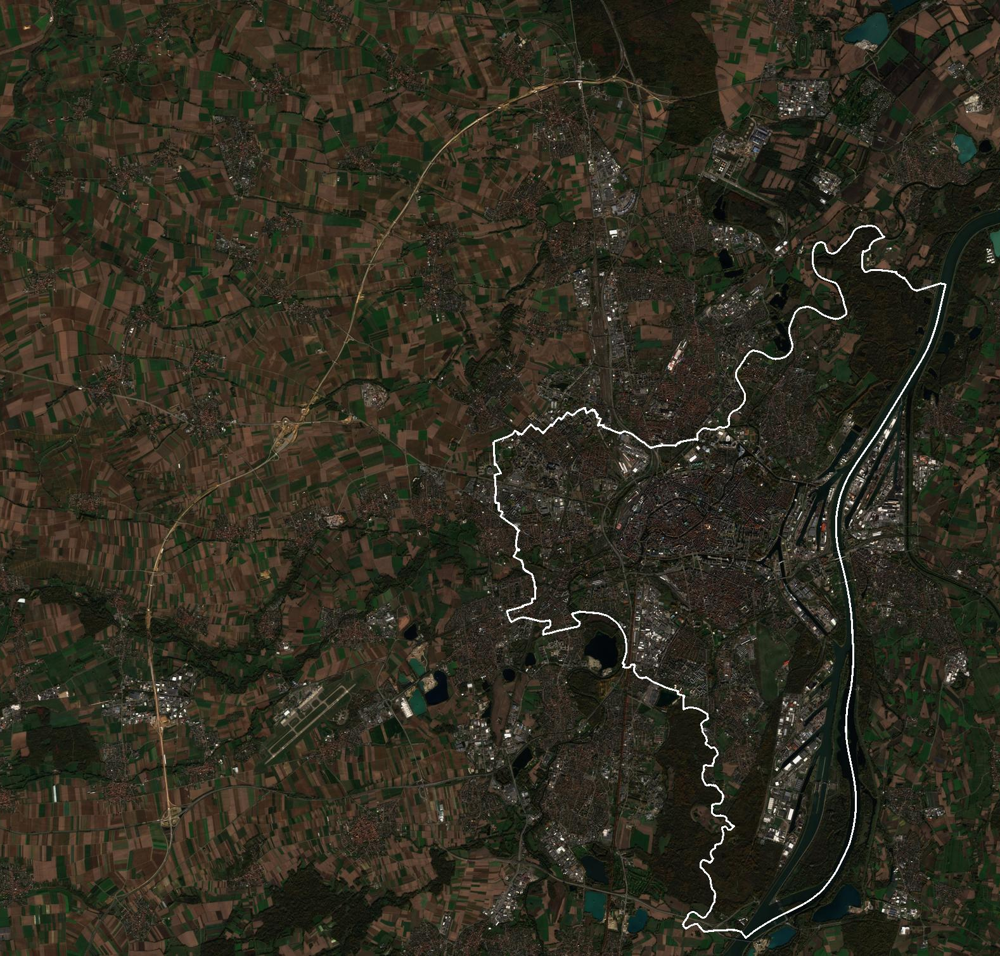

OK pour ce retaillage ?OK
C'est parti...


In [24]:
taillage_selection("bac_a_sable/images/", (1000,0,600,0))

Et si on ajoutait maintenant **un texte au même endroit de chaque image**, afin de contextualiser ce repère ?

On est parti sur cette jolie police, dénichée sur [Google Font](https://fonts.google.com/specimen/Roboto+Mono?vfonly=true&preview.text=STRASBOURG&preview.text_type=custom#standard-styles). Elle est sous licence Apache, donc on peut y aller !

Importons vite le nécessaire :

In [25]:
from PIL import ImageFont, ImageDraw

c_police = "bac_a_sable/police/RobotoMono-Bold.ttf"

La fonction suit le même plan :

* on considère la dernière image, sur laquelle le texte est plaqué
* on demande validation
* si validation il y a, on déploie

In [26]:
def ajout_texte(repertoire, texte, coordonnees, t_police):
    # on met le chemin complet de la police en variable
    police_ref = ImageFont.truetype(c_police, t_police)
    with Image.open(os.path.join(repertoire, os.listdir(repertoire)[-1])) as test:
        # on crée une nouvelle variable pour dessiner dessus...
        d_test = ImageDraw.Draw(test)
        # et... on exécute
        d_test.text(coordonnees,texte,(255,255,255),font=police_ref)
        display(test)
        reponse = input("OK pour ce placement de texte ?")
        if reponse != "OK":
            print("Eh bien retentez autre chose !")
        else:
            print("C'est parti...")
            for photo in os.listdir(repertoire):
                chemin = os.path.join(repertoire, photo)
                with Image.open(chemin) as img:
                    im_text=ImageDraw.Draw(img)
                    im_text.text(coordonnees,texte,(255,255,255),font=police_ref)
                    img.save(os.path.join(chemin))

Avant l'application de la fonction, une petite note sur les coordonnées : **le point (0,0)** correspondant **au bord supérieur gauche de l'image**. 

Il faut donc tâtonner au doigt mouillé à partir de là, mais magie de l'omniscience, j'ai déjà mâché le travail :

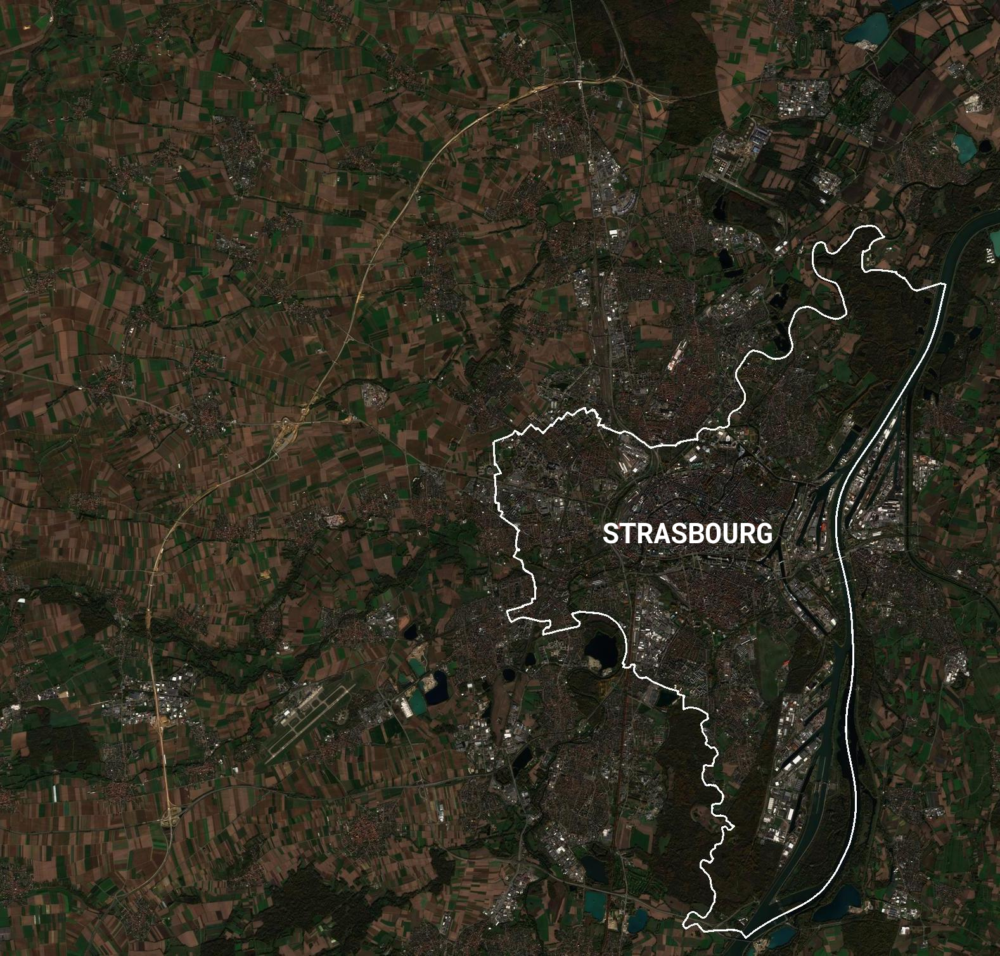

OK pour ce placement de texte ?OK
C'est parti...


In [27]:
ajout_texte("bac_a_sable/images/", "STRASBOURG", (950,810), 45)

Dernière chose avant le paramétrage du GIF : la date, qui serait quand même un plus. Chaque photographie téléchargée sur EO Browser contient, **au début de son nom, la date de prise de vue**.

On va s'en servir sans scrupule, **en utilisant une expression régulière** qui transformera "2020-01-20" en "20-01-2020". Cela va se passer avec le [module Pyton re](https://docs.python.org/fr/3.6/library/re.html).

In [28]:
import re

def ajout_date(repertoire, coordonnees, t_police):
    police_ref = ImageFont.truetype(c_police, t_police)
    with Image.open(os.path.join(repertoire, os.listdir(repertoire)[-1])) as test:
        # on crée une variable qui correspond aux dix premiers caractères du nom du fichier (AAAA-MM-JJ)
        date_brut = (os.listdir(repertoire)[-1])[0:10]
        # on sélectionne trois groupes de cara (1:AAAA, 2:MM, 3:JJ) pour les replacer dans l'ordre JJ-MM-AAAA
        date = re.sub(r'(\d{4})-(\d{2})-(\d{2})', r'\g<3>/\g<2>/\g<1>',date_brut)
        # et on superpose la date sur le modèle précédent
        d_test = ImageDraw.Draw(test)
        d_test.text(coordonnees,date,(255,255,255),font=police_ref)
        display(test)
        reponse = input("OK pour ce placement de texte ?")
        if reponse != "OK":
            print("Eh bien retentez autre chose !")
        else:
            print("C'est parti...")
            for photo in os.listdir(repertoire):
                chemin = os.path.join(repertoire, photo)
                with Image.open(chemin) as img:
                    date_brut = (photo)[0:10]
                    date = re.sub(r'(\d{4})-(\d{2})-(\d{2})', r'\g<3>/\g<2>/\g<1>',date_brut)
                    im_text=ImageDraw.Draw(img)
                    im_text.text(coordonnees,date,(255,255,255),font=police_ref)
                    img.save(os.path.join(chemin))

Un petit test pour l'hygiène ?

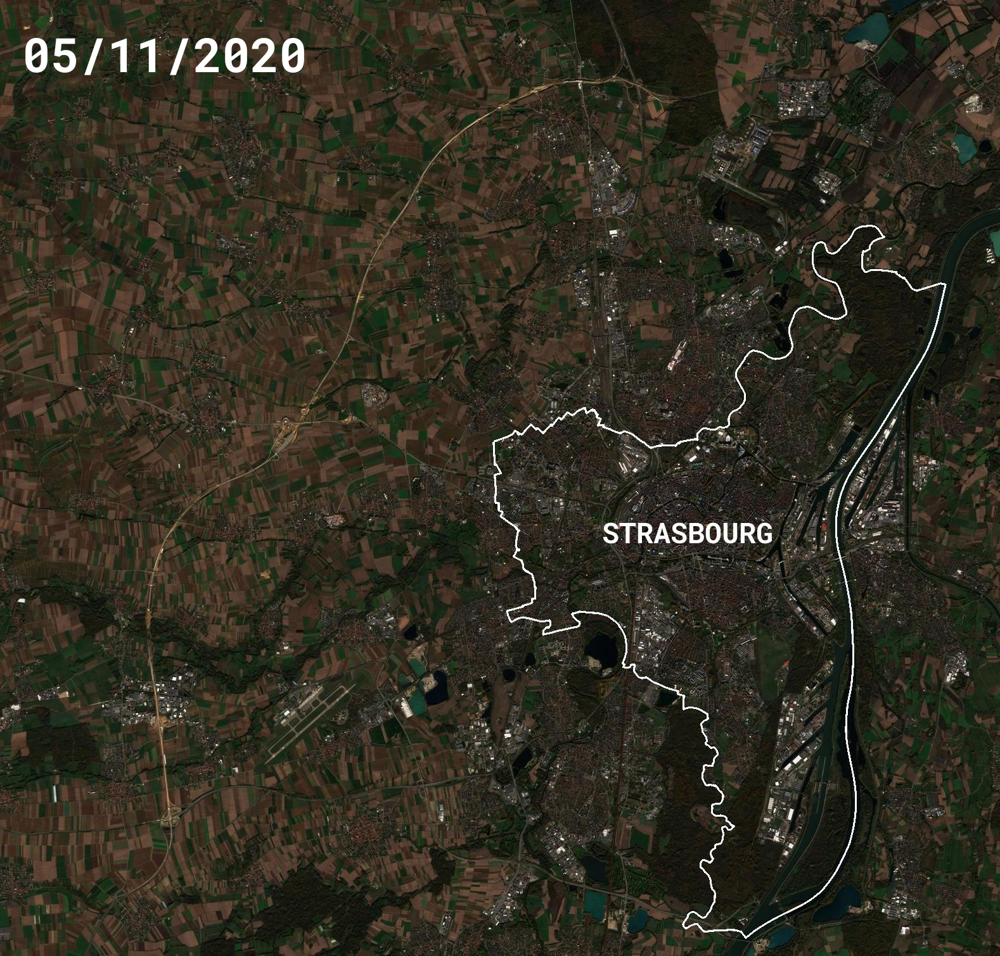

OK pour ce placement de texte ?OK
C'est parti...


In [29]:
ajout_date("bac_a_sable/images/", (35,35), 75)

## C'est le GIF final

On arrive sur une des limites de ce tuto : **le poids du GIF final**. Il n'y pas trente-six solutions, mais plutôt deux :

* **réduire le nombre d'images**. On en compte presque trente dans cet exemple, ce qui est beaucoup
* **réduire la taille de chaque image**

On part sur le second compromis, en essayant de se calquer sur les dimensions du GIF de SentinelHub (un carré de 512x512 pixels)

Une solution assez simple est de proposer un pourcentage à retrancher dans une fonction, qui s'appliquera en largeur et en hauteur :

In [30]:
def derniere_retaille(repertoire, pct):
    with Image.open(os.path.join(repertoire, os.listdir(repertoire)[0])) as verif:
        largeur_depart, hauteur_depart = verif.size
        print("L'image de base fait ",largeur_depart," pixels de large et ",hauteur_depart," pixels de haut")
        print("Après retaille, elle fera ",round(int(largeur_depart*pct))," pixels de large et ",round(int(hauteur_depart*pct))," pixels de haut")
        reponse = input("OK pour ce placement de texte ?")
        if reponse != "OK":
            print("Eh bien retentez autre chose !")
        else:
            print("C'est parti")
            for photo in os.listdir(repertoire):
                chemin = os.path.join(repertoire, photo)
                with Image.open(chemin) as img:
                    largeur, hauteur = img.size
                    img = img.resize((round(int(largeur*pct)), round(int(hauteur*pct))))
                    img.save(os.path.join(chemin))

On va se lancer franco, avec une taille équivalant à 35% des originales :

In [31]:
derniere_retaille("bac_a_sable/images", .35)

L'image de base fait  1578  pixels de large et  1510  pixels de haut
Après retaille, elle fera  552  pixels de large et  528  pixels de haut
OK pour ce placement de texte ?OK
C'est parti


Et voici une toute bête fonction de création de GIF. La seule difficulté est bien de paramétrer la compréhension de listes avec les images retenues :

In [32]:
def creation_gif(repertoire,destination_g, duree):
    img, *images = [Image.open(os.path.join(repertoire, photo)) for photo in os.listdir(repertoire)]
    img.save(fp=destination_g, format='GIF', append_images=images, save_all=True, duration=300, loop=0)

Go pour le GIF final :

In [33]:
creation_gif("bac_a_sable/images","GCO_strasbourg.gif",300)

2 Mo de moins pour la restitution de ce tuto, ce qui n'est pas rien, et des infos en plus. Mission accomplie !

![GCO, que voilà avec repère !](GCO_strasbourg.gif "GCO, que voilà avec repère !")